## EDA For Baseball research

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


season_21 = pd.read_csv('data/TBR Capstone Data/pitches_21.csv')
season_22 = pd.read_csv('data/TBR Capstone Data/pitches_22.csv')
season_23 = pd.read_csv('data/TBR Capstone Data/pitches_23.csv')
all_seasons = pd.concat([season_21, season_22, season_23], ignore_index=True)

### Setting up Variables

In [3]:
all_seasons['GameDate'] = pd.to_datetime(all_seasons['GameDate'])
all_seasons['Date'] = all_seasons['GameDate'].dt.date
season_21['Time'] = all_seasons['GameDate'].dt.time

cols = list(all_seasons.columns)
idx = cols.index('GameDate')
new_cols = cols[:idx + 1] + ['Date', 'Time'] + cols[idx + 1:-2]

In [4]:
all_seasons  = all_seasons.sort_values(by = ['Date', 'Home', 'ab'])
all_seasons = all_seasons.drop(columns = ['Unnamed: 0'])
all_seasons

,gameid,GameDate,ab,pitchnum,inning,teambat,balls,strikes,outs,pitcher,...,inducedvertbreak,platelocside,platelocheight,hometeam_id,Home,awayteam_id,Visitor,venue_id,venue_name,Date
104858,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,1,1.0,0,0.0,0.0,0.0,"Hendricks, Kyle",...,20.196724,-0.925614,3.118610,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104859,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,2,1.0,0,1.0,0.0,0.0,"Hendricks, Kyle",...,20.294086,-0.000916,1.945728,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104860,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,3,1.0,0,1.0,1.0,0.0,"Hendricks, Kyle",...,18.184725,-1.969467,3.548406,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104861,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,4,1.0,0,2.0,1.0,0.0,"Hendricks, Kyle",...,19.395239,-1.160865,2.435223,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
104862,2021/04/01/pitmlb-chnmlb-1,2021-04-01 13:20:00,1,5,1.0,0,3.0,1.0,0.0,"Hendricks, Kyle",...,17.362413,0.046086,2.654030,112,Chicago Cubs,134,Pittsburgh Pirates,17,Wrigley Field,2021-04-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2047122,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,67,2,NaN,1,NaN,NaN,NaN,NaN,...,16.845800,-0.149840,3.708887,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02
2047123,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,68,1,NaN,1,NaN,NaN,NaN,NaN,...,10.574021,-1.381323,2.591258,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02
2047360,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,68,2,NaN,1,NaN,NaN,NaN,NaN,...,-1.425607,0.139988,2.687900,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02
2047361,2023/09/28/miamlb-nynmlb-1,2023-10-02 17:10:00,68,3,NaN,1,NaN,NaN,NaN,NaN,...,-0.707107,1.429425,0.572016,121,New York Mets,146,Miami Marlins,3289,Citi Field,2023-10-02


Checking how many rows were dropped from the dataset.

In [5]:
original_length = len(all_seasons)
df_cleaned = all_seasons.dropna()
cleaned_length = len(df_cleaned)
rows_dropped = original_length - cleaned_length
print(f'Number of rows dropped: {rows_dropped}')

Number of rows dropped: 4677


Our early event types separation.

In [6]:
#Defining the event types
strikeout_events = ["strikeout", "strikeout_double_play"]
fieldout_events = ["field_out", "grounded_into_double_play", "force_out", "fielders_choice_out", 
                   "fielders_choice", "double_play", "sac_fly", "sac_bunt", "sac_fly_double_play", "triple_play"]
complements = ["ball", "single", "blocked_ball", "foul", "walk", "force_out", "wild_pitch", "stolen_base_2b", 
               "homerun", "hit_by_pitch", "double", "triple", "field_error", "stolen_base_3b", "passed_ball", 
               "caught_stealing_2b", "defensive_indiff", "caught_stealing_3b", "pitchout", 
               "swinging_strike_blocked", "swinging_strike", "pickoff_caught_stealing_2b", "missed_bunt", 
               "caught_stealing_home", "other_advance", "called_strike", "stolen_base_home"]
hit = ["single", "homerun", "double", "triple"]

In [7]:
strikeout_df = df_cleaned[df_cleaned['eventtype'].isin(strikeout_events)]
fieldout_df = df_cleaned[df_cleaned['eventtype'].isin(fieldout_events)]

In [8]:
strikeout_df.loc[:, 'is_strikeout'] = strikeout_df['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)

C:\Users\BotTe\AppData\Local\Temp\ipykernel_51352\1704399209.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  strikeout_df.loc[:, 'is_strikeout'] = strikeout_df['eventtype'].apply(lambda x: 1 if x in strikeout_events else 0)


Early graphs

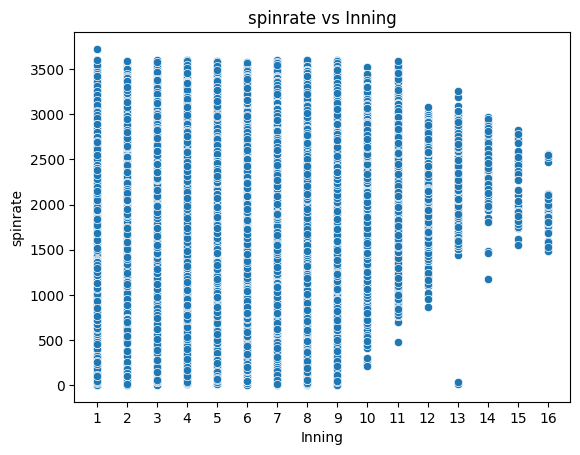

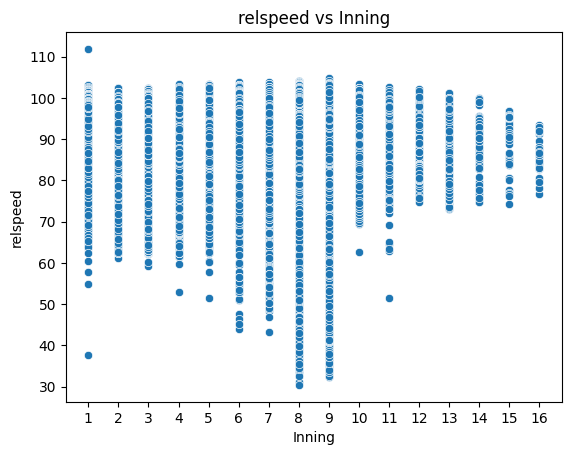

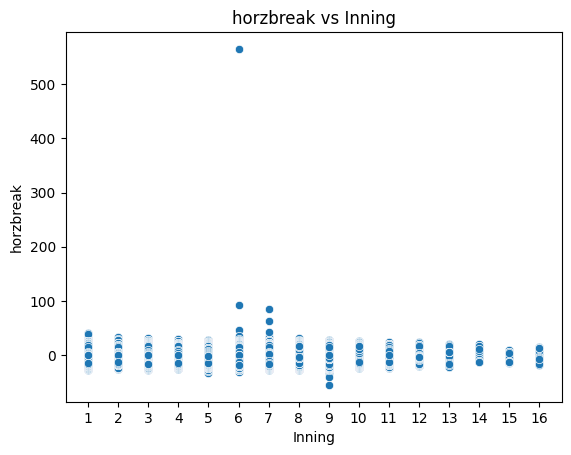

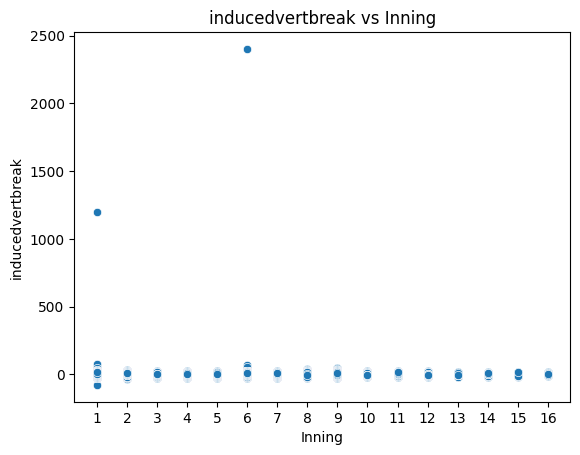

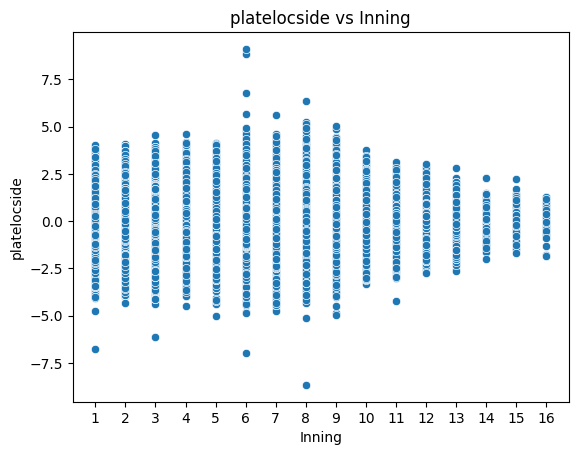

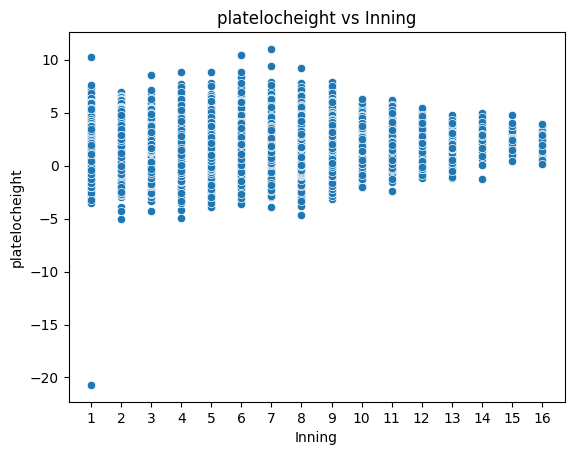

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside','platelocheight']
inning_min = int(all_seasons['inning'].min())
inning_max = int(all_seasons['inning'].max())
inning_range = list(range(inning_min, inning_max + 1))
for i, feature in enumerate(features):
    plt.figure(i)  
    sns.scatterplot(x='inning', y=feature, data=all_seasons)
    plt.xticks(inning_range)
    plt.title(f'{feature} vs Inning')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    plt.show()


Exactly two strikes counts

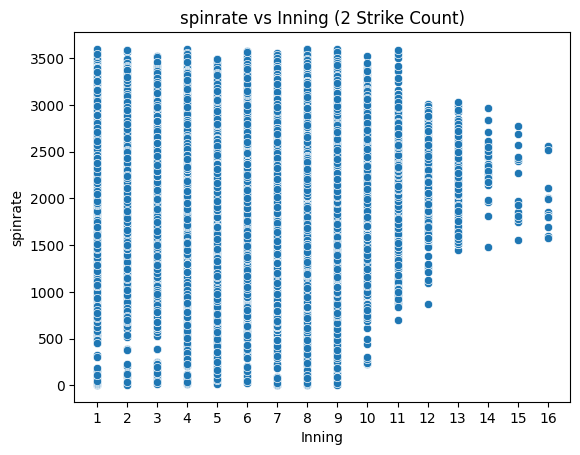

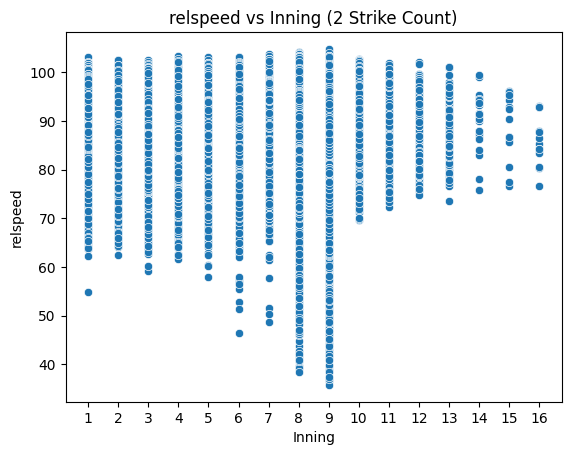

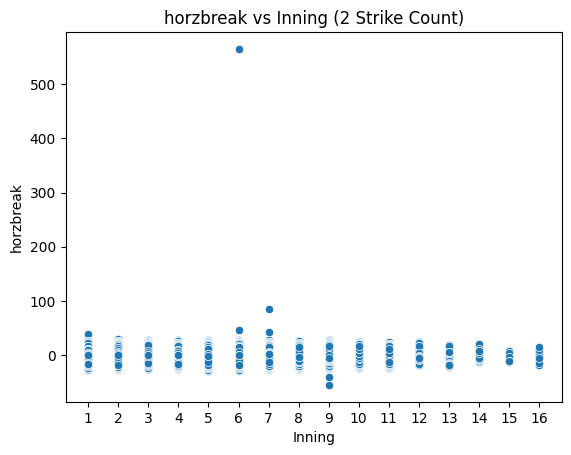

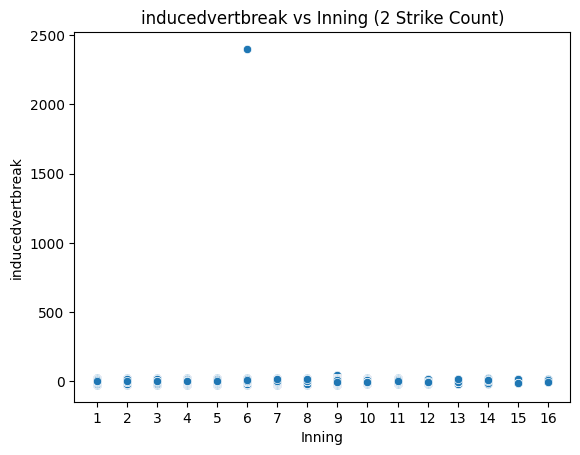

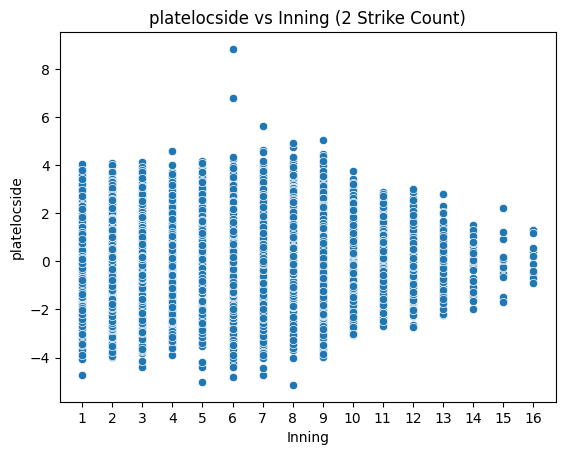

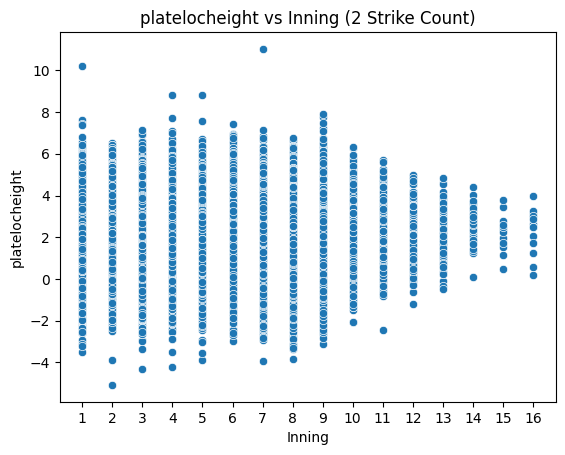

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

two_strike_df = all_seasons[all_seasons['strikes'] == 2]
features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside','platelocheight']
inning_min = int(two_strike_df['inning'].min())
inning_max = int(two_strike_df['inning'].max())
inning_range = list(range(inning_min, inning_max + 1))

for i, feature in enumerate(features):
    plt.figure(i)  
    sns.scatterplot(x='inning', y=feature, data=two_strike_df)
    plt.xticks(inning_range)
    plt.title(f'{feature} vs Inning (2 Strike Count)')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    plt.show()


Outliers removed

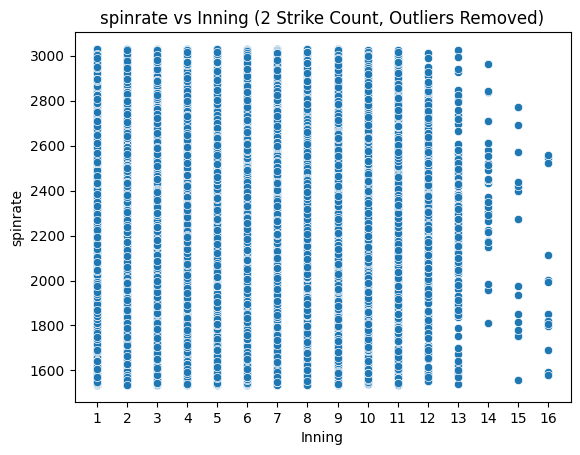

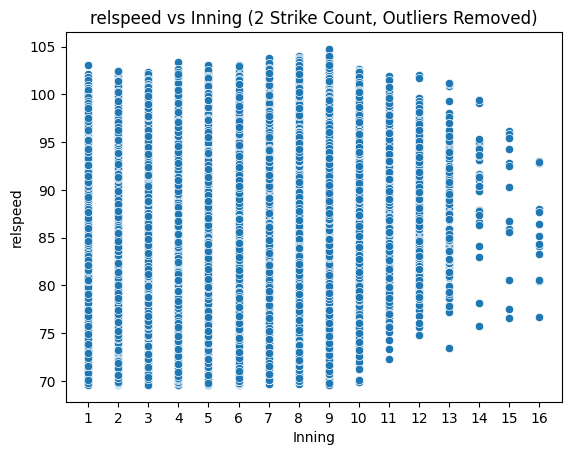

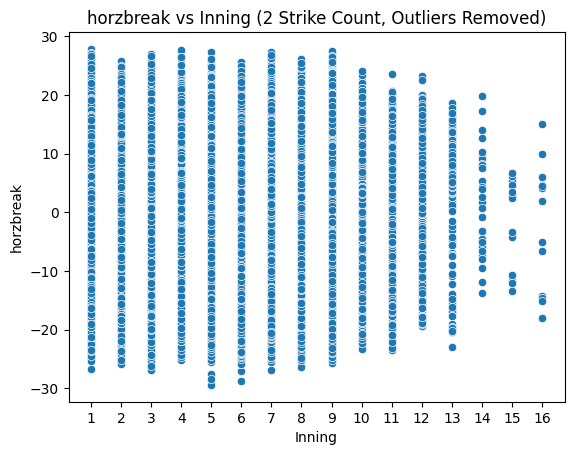

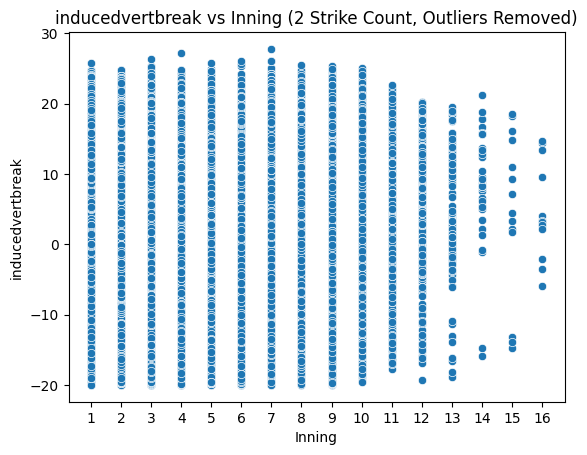

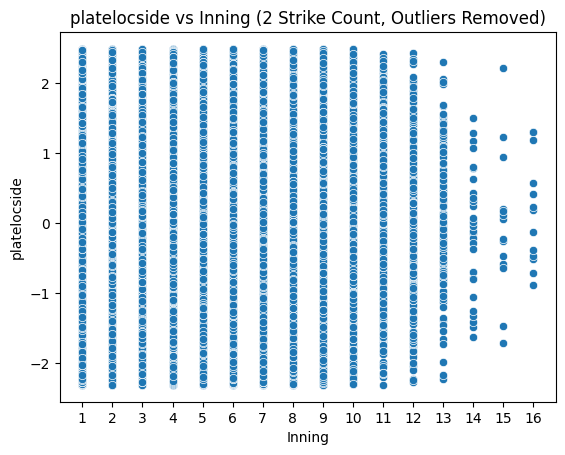

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

two_strike_df = all_seasons[all_seasons['strikes'] == 2]
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside']

two_strike_df_cleaned = remove_outliers(two_strike_df, features)

inning_min = int(two_strike_df_cleaned['inning'].min())
inning_max = int(two_strike_df_cleaned['inning'].max())
inning_range = list(range(inning_min, inning_max + 1))

for i, feature in enumerate(features):
    plt.figure(i)  
    sns.scatterplot(x='inning', y=feature, data=two_strike_df_cleaned)
    plt.xticks(inning_range)
    plt.title(f'{feature} vs Inning (2 Strike Count, Outliers Removed)')
    plt.xlabel('Inning')
    plt.ylabel(feature)
    plt.show()


Switching to at-bats graph of each feature for we can really see the difference.

C:\Users\BotTe\AppData\Local\Temp\ipykernel_51352\3903673176.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  two_strike_df_cleaned['event_category'] = two_strike_df_cleaned['eventtype'].apply(categorize_event)


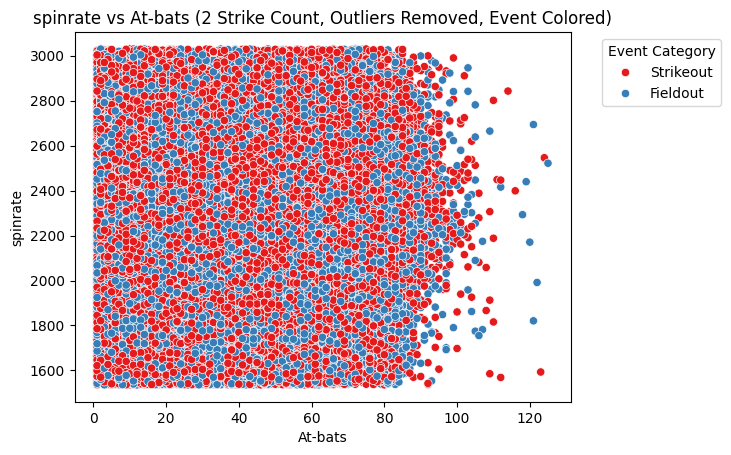

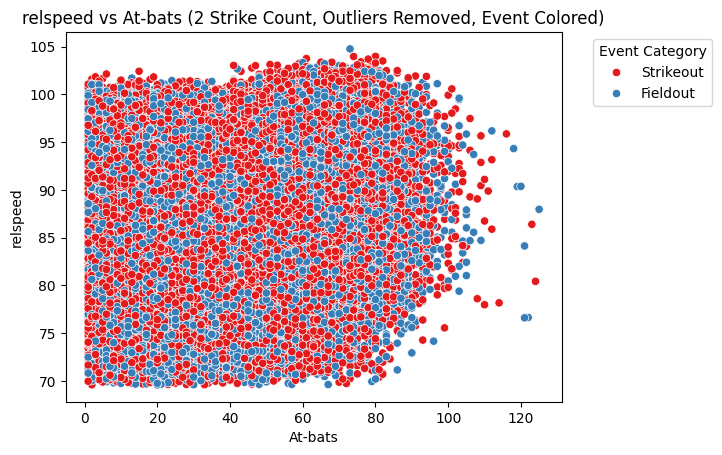

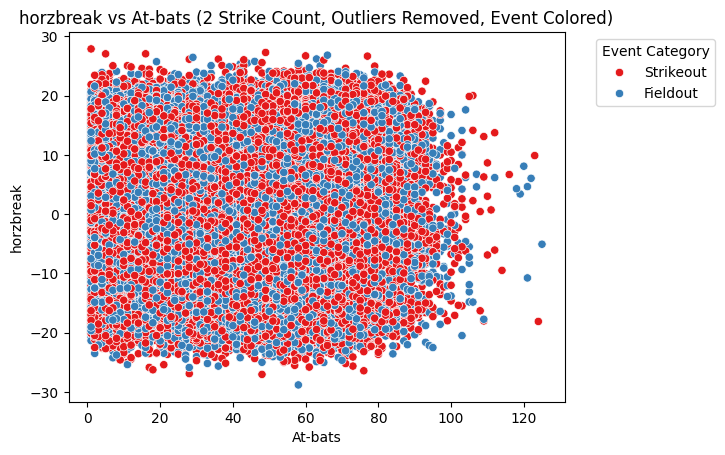

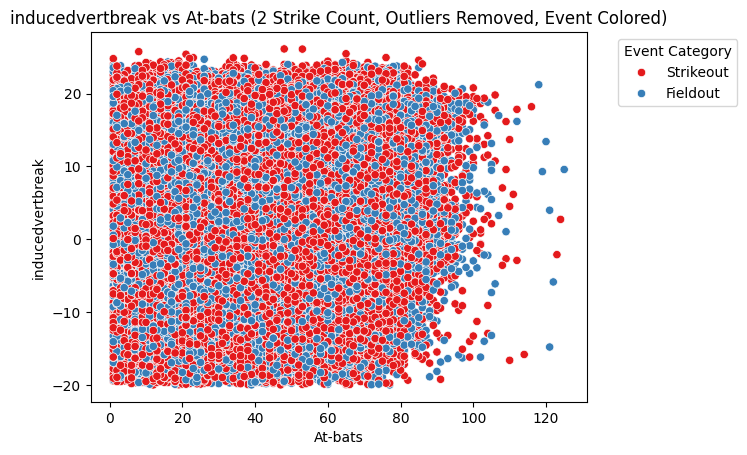

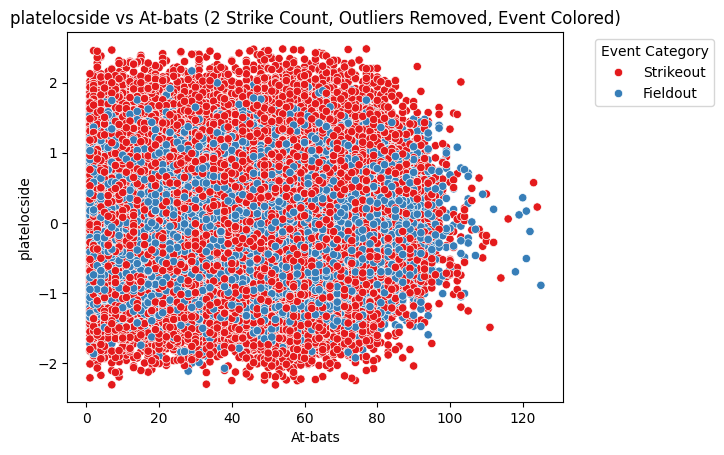

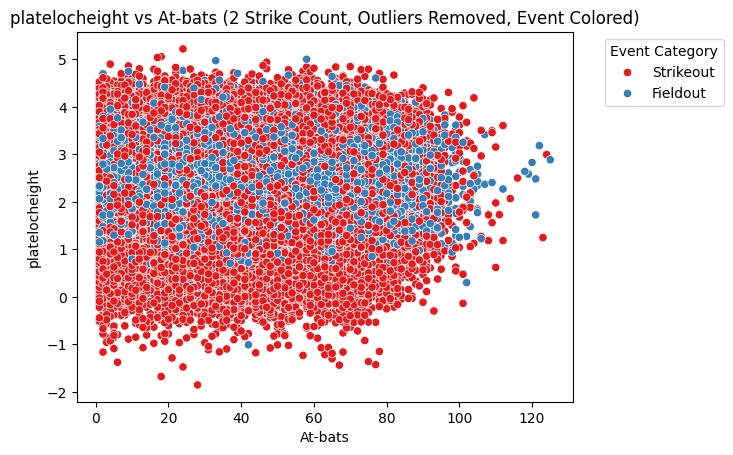

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

two_strike_df = all_seasons[all_seasons['strikes'] == 2 ]
def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

two_strike_df_cleaned = remove_outliers(two_strike_df, ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside'])

def categorize_event(event):
    if event in strikeout_events:
        return 'Strikeout'
    elif event in fieldout_events:
        return 'Fieldout'

two_strike_df_cleaned['event_category'] = two_strike_df_cleaned['eventtype'].apply(categorize_event)
inning_min = int(two_strike_df_cleaned['ab'].min())
inning_max = int(two_strike_df_cleaned['ab'].max())
inning_range = list(range(inning_min, inning_max + 1))

features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside', 'platelocheight']

for i, feature in enumerate(features):
    plt.figure(i)  
    sns.scatterplot(x='ab', y=feature, hue='event_category', palette='Set1', data=two_strike_df_cleaned)
    plt.title(f'{feature} vs At-bats (2 Strike Count, Outliers Removed, Event Colored)')
    plt.xlabel('At-bats')
    plt.ylabel(feature)
    plt.legend(title='Event Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()


Exploring more of the counts, more specifically 2 strikes and 0 & 1 balls, we see an interesting result here that lead to our models going to only right handed pitchers.

C:\Users\BotTe\AppData\Local\Temp\ipykernel_51352\2816026371.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  two_strike_three_ball_df_cleaned['event_category'] = two_strike_three_ball_df_cleaned['eventtype'].apply(categorize_event)


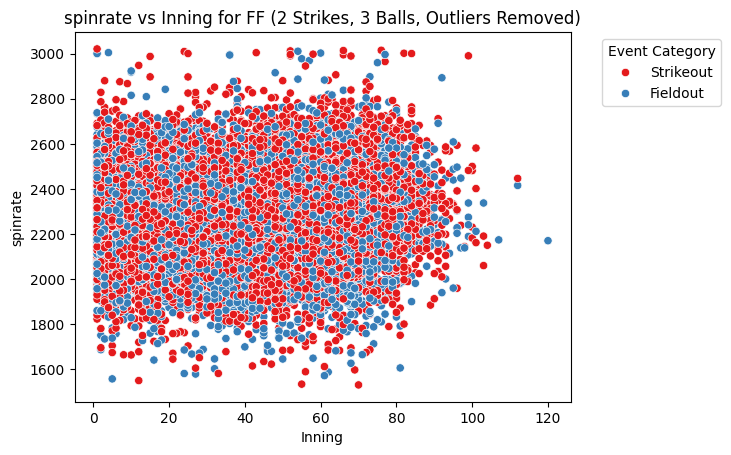

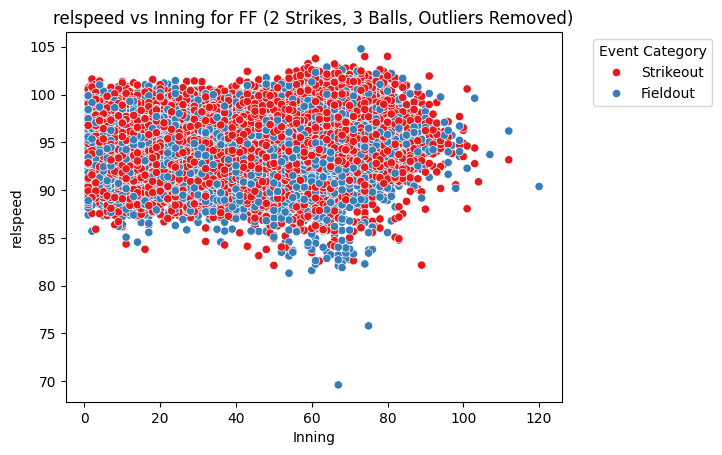

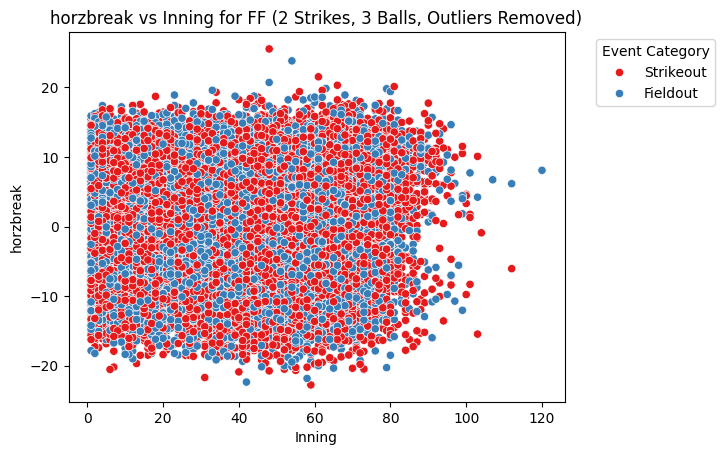

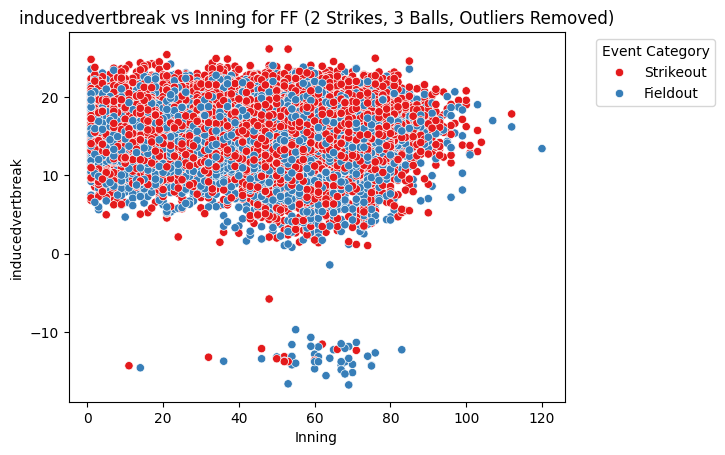

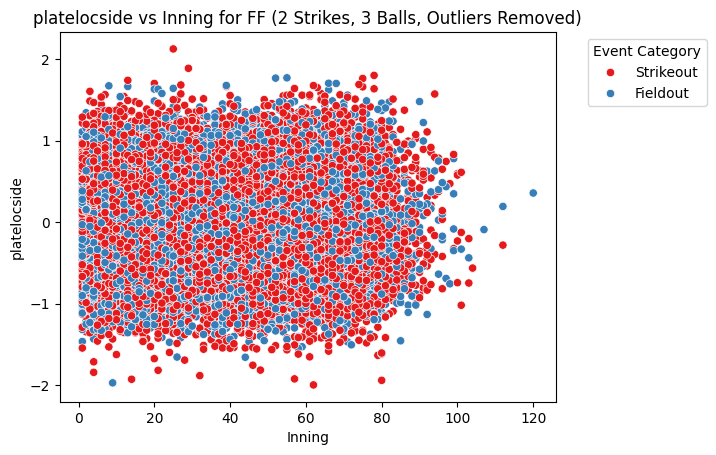

...

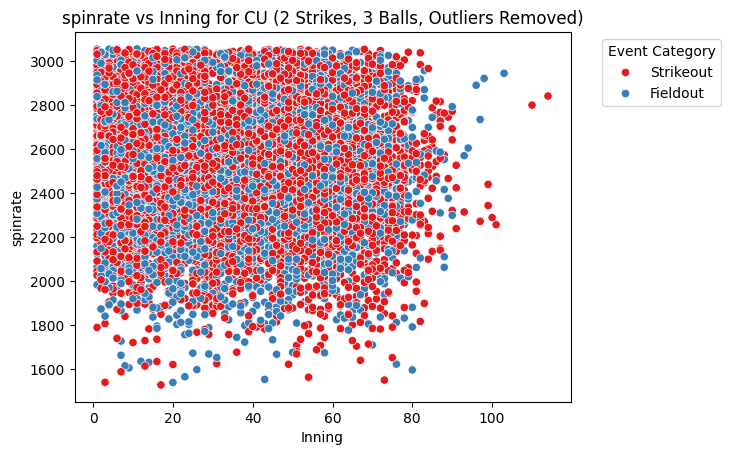

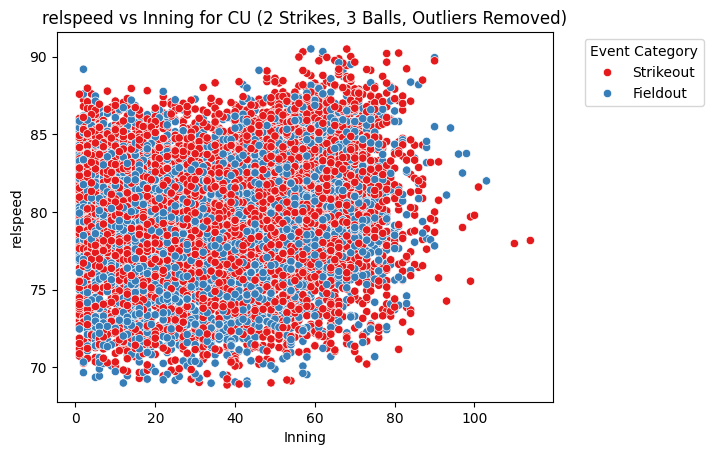

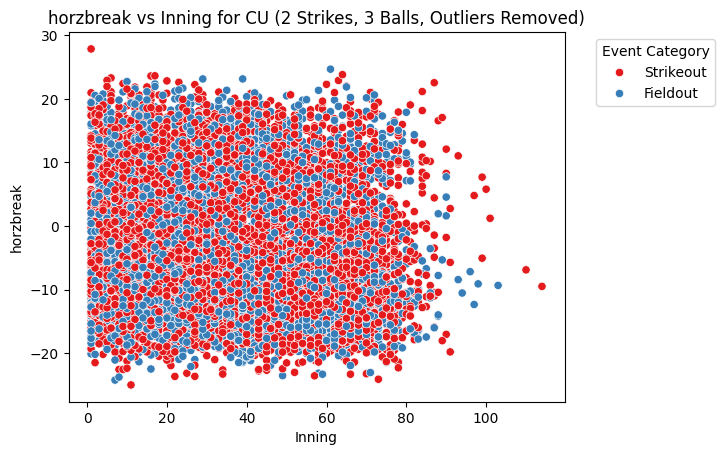

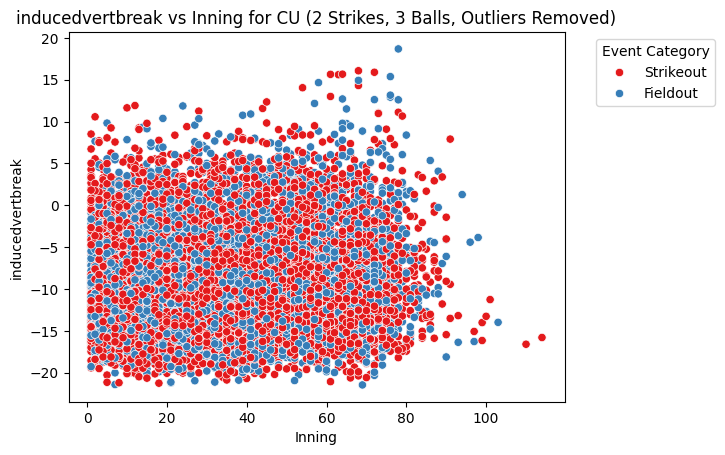

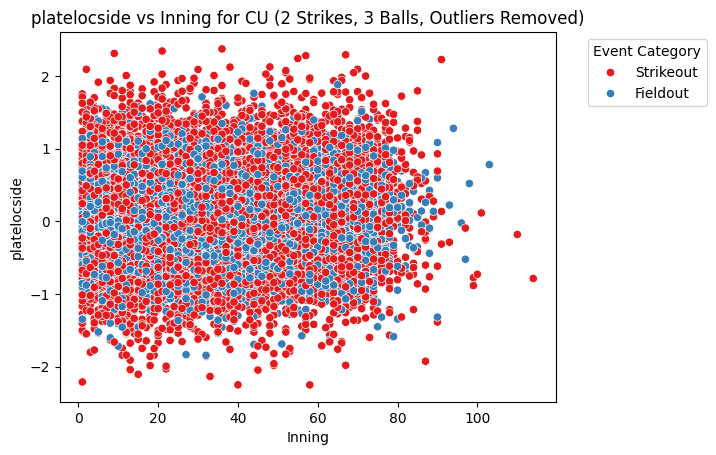

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

two_strike_three_ball_df = all_seasons[(all_seasons['strikes'] == 2) & (all_seasons['balls'].isin([0,1]))]

def remove_outliers(df, columns):
    Q1 = df[columns].quantile(0.25)
    Q3 = df[columns].quantile(0.75)
    IQR = Q3 - Q1
    df_outliers_removed = df[~((df[columns] < (Q1 - 1.5 * IQR)) | (df[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df_outliers_removed

two_strike_three_ball_df_cleaned = remove_outliers(two_strike_three_ball_df, ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside'])

def categorize_event(event):
    if event in strikeout_events:
        return 'Strikeout'
    elif event in fieldout_events:
        return 'Fieldout'
    

two_strike_three_ball_df_cleaned['event_category'] = two_strike_three_ball_df_cleaned['eventtype'].apply(categorize_event)
pitch_types = ['FF', 'SL', 'KC', 'CH', 'SI', 'FC', 'CU']

features = ['spinrate', 'relspeed', 'horzbreak', 'inducedvertbreak', 'platelocside']

for pitch_type in pitch_types:
    pitch_df = two_strike_three_ball_df_cleaned[two_strike_three_ball_df_cleaned['pitchname'] == pitch_type]
    for i, feature in enumerate(features):
        plt.figure(i) 
        sns.scatterplot(x='ab', y=feature, hue='event_category', palette='Set1', data=pitch_df)
        plt.title(f'{feature} vs Inning for {pitch_type} (2 Strikes, 3 Balls, Outliers Removed)')
        plt.xlabel('Inning')
        plt.ylabel(feature)
        plt.legend(title='Event Category', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.show()
